# Analysis for Figure3

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import scanpy.external as sce
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import rapids_singlecell as rsc
import scanpy as sc
import cupyx as cpx
import pandas as pd
import numpy as np
import scipy.stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scib
import scib_metrics
import palantir

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

sc.settings.verbosity = 3

print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):


In [216]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
    d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
    adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
    gc.collect()

In [217]:
adata.obs.value_counts(["dose_training", "dose", "dose_val"])

dose_training  dose   dose_val
3              1.0    0.010       2171
0              0.0    0.000       2155
1              0.1    0.001       1961
5              10.0   0.100       1940
2              0.5    0.005       1792
4              5.0    0.050       1790
6              50.0   0.500       1767
7              100.0  1.000       1235
dtype: int64

In [218]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v2_encode"
)
vae = tardis.MyModel.load(dir_path, adata=adata)

INFO     File /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/cpa_sciplex_v2_encode/model.pt already 
         downloaded                                                                                                


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


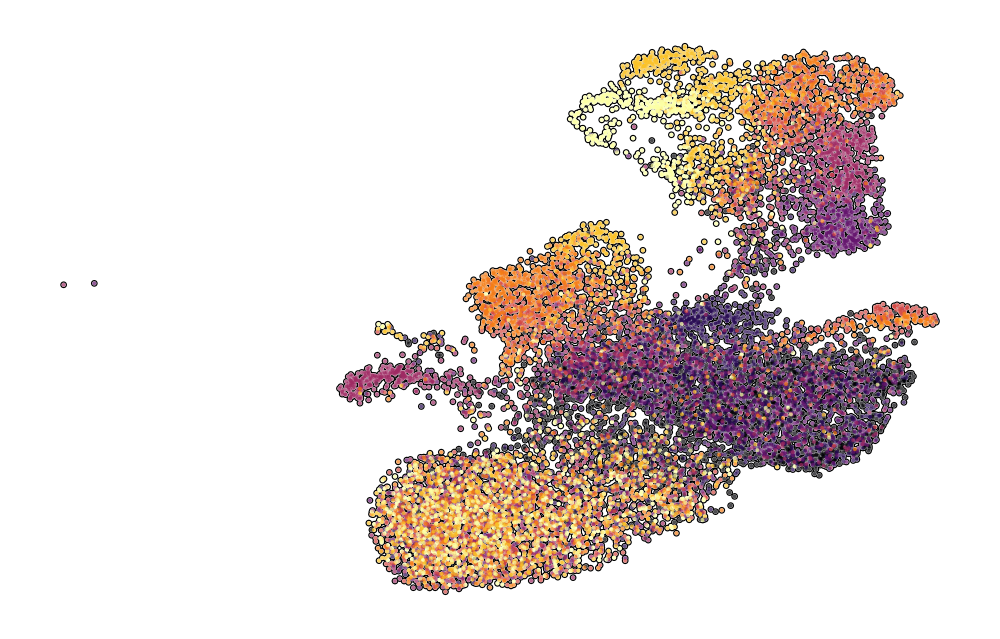

In [219]:
figsize = (8, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    adata,
    color="dose_training",
    ncols=2,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    color_map="inferno",
    title="",
    # legend_loc="on data",
    # legend_fontweight="semibold",
    # legend_fontoutline=2,
    add_outline=True,
    colorbar_loc=None
)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_dose_before.pdf"), format="pdf")

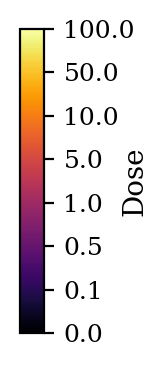

In [220]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colorbar as colorbar
import matplotlib.colors as mcolors

# Step 2: Normalize the data
norm = mcolors.Normalize(vmin=adata.obs['dose_training'].min(), vmax=adata.obs['dose_training'].max())

# Step 3: Create a scalar mappable object
sm = cm.ScalarMappable(cmap='inferno', norm=norm)
sm.set_array([])

# Step 4: Create the colorbar

fig, ax = plt.subplots(figsize=(4, 4))
fig.subplots_adjust(bottom=0.5, right=0.2, left=0.17)

cbar = fig.colorbar(sm, cax=ax, orientation='vertical')
cbar.set_label('Dose', labelpad=-5)

# Move the colorbar label to the right side
cbar.ax.yaxis.set_label_position('right')
cbar.ax.yaxis.set_ticks_position('right')

tick_values = [0, 1, 2, 3, 4, 5, 6, 7]  # Positions for the ticks (normalized values)
tick_labels = ['0.0', '0.1', '0.5', '1.0', '5.0', '10.0', '50.0', '100.0']  # New tick labels
cbar.set_ticks(tick_values)
cbar.set_ticklabels(tick_labels, fontsize=9)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_dose_colorbar.pdf"), format="pdf")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


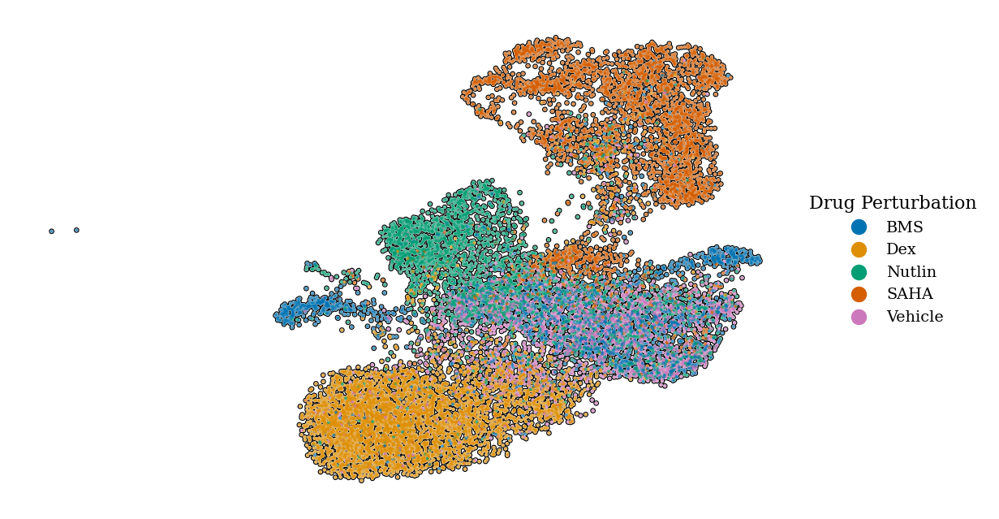

In [228]:
figsize = (8, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    adata,
    color="condition",
    ncols=2,
    frameon=False,
    palette=sns.color_palette("colorblind"),
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    title="",
    # legend_loc="on data",
    # legend_fontweight="semibold",
    # legend_fontoutline=2,
    add_outline=True,
)
plt.gca().legend_.set_title("Drug Perturbation", prop={'size':8})

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_condition_before.pdf"), format="pdf")

In [229]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


In [230]:
# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
#     sc.pl.umap(
#         latent, 
#         color=['dose_training', 'condition', 'dose'], 
#         ncols=3,
#         frameon=False,
#         legend_fontsize="xx-small"
#     )

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


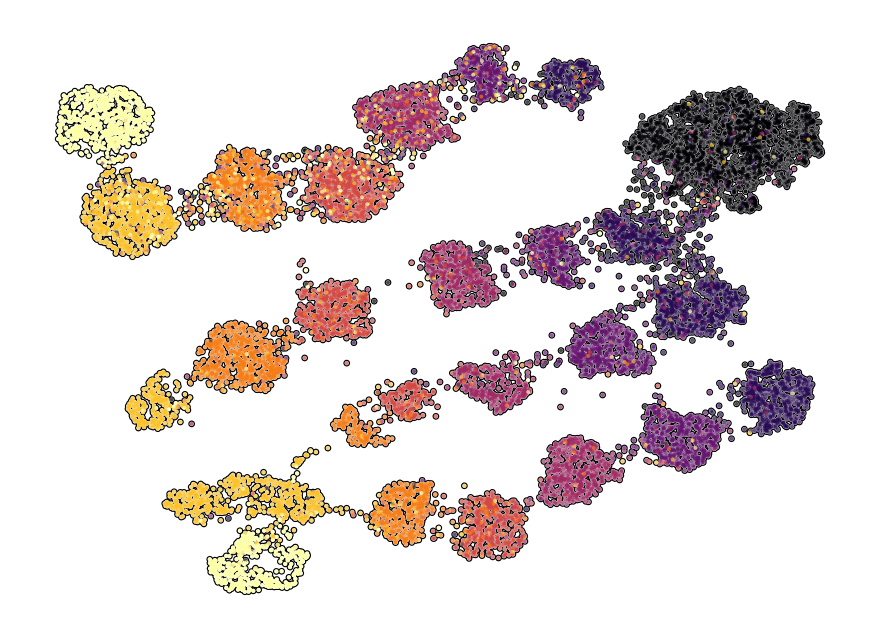

In [231]:
figsize = (7, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    latent,
    color="dose_training",
    ncols=2,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    color_map="inferno",
    title="",
    # legend_loc="on data",
    # legend_fontweight="semibold",
    # legend_fontoutline=2,
    add_outline=True,
    colorbar_loc=None
)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_dose.pdf"), format="pdf")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


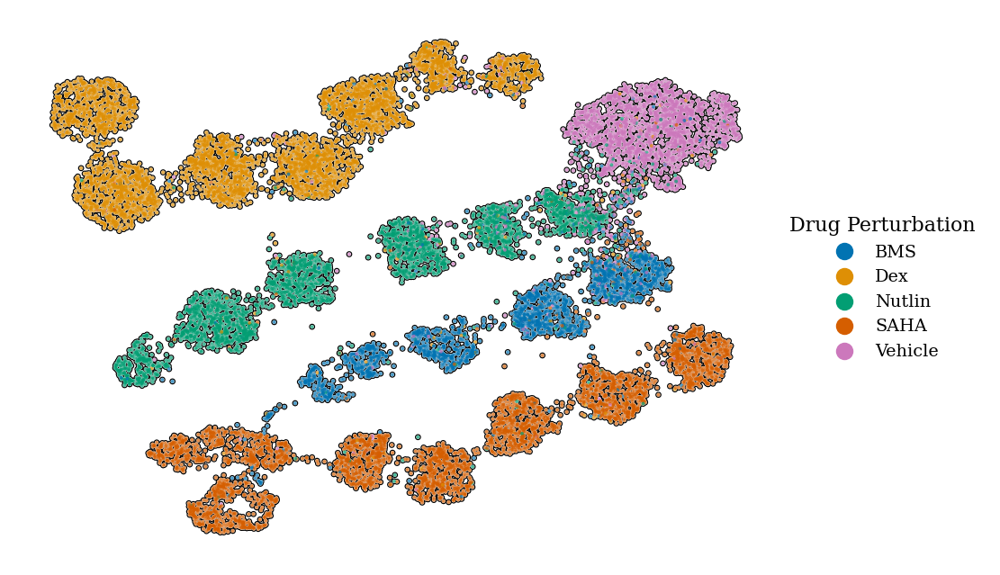

In [232]:
figsize = (7, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    latent,
    color="condition",
    ncols=2,
    frameon=False,
    palette=sns.color_palette("colorblind"),
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    title="",
    # legend_loc="on data",
    # legend_fontweight="semibold",
    # legend_fontoutline=2,
    add_outline=True,
)

plt.gca().legend_.set_title("Drug Perturbation", prop={'size':8})
plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_condition.pdf"), format="pdf")

In [233]:
from tardis._disentanglementmanager import DisentanglementManager

In [234]:
batch_size_vae_metrics = 512

vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -1990.8793548713793
elbo -2051.205322265625
r2_train 0.9981684725174991
r2_validation 0.9983863344205348


In [235]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


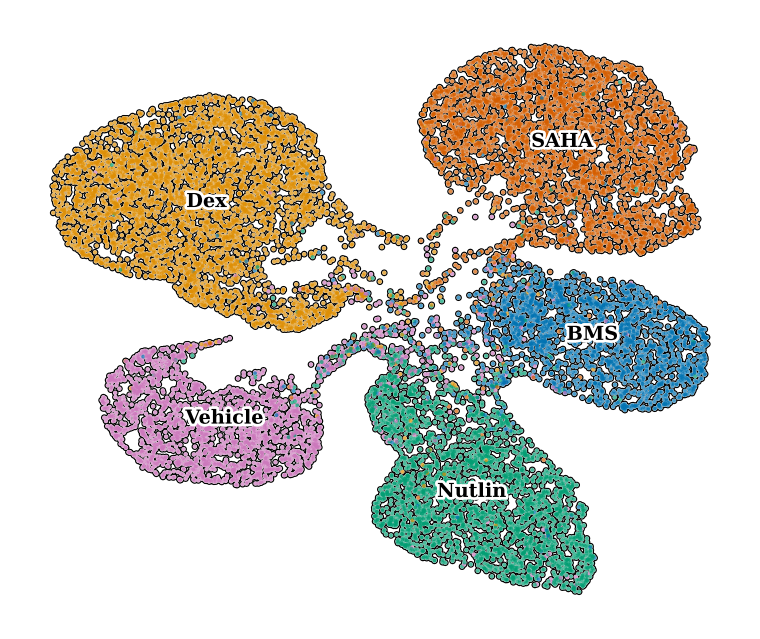

In [236]:
figsize = (6, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    latent,
    color=["condition"],
    ncols=2,
    palette=sns.color_palette("colorblind"),
    colorbar_loc=None,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=True,
)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_condition_latent.pdf"), format="pdf")

In [237]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())
sc.tl.pca(latent, n_comps=7)
dm_res = palantir.utils.run_diffusion_maps(latent, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(latent)

computing PCA
    with n_comps=7
    finished (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [238]:
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


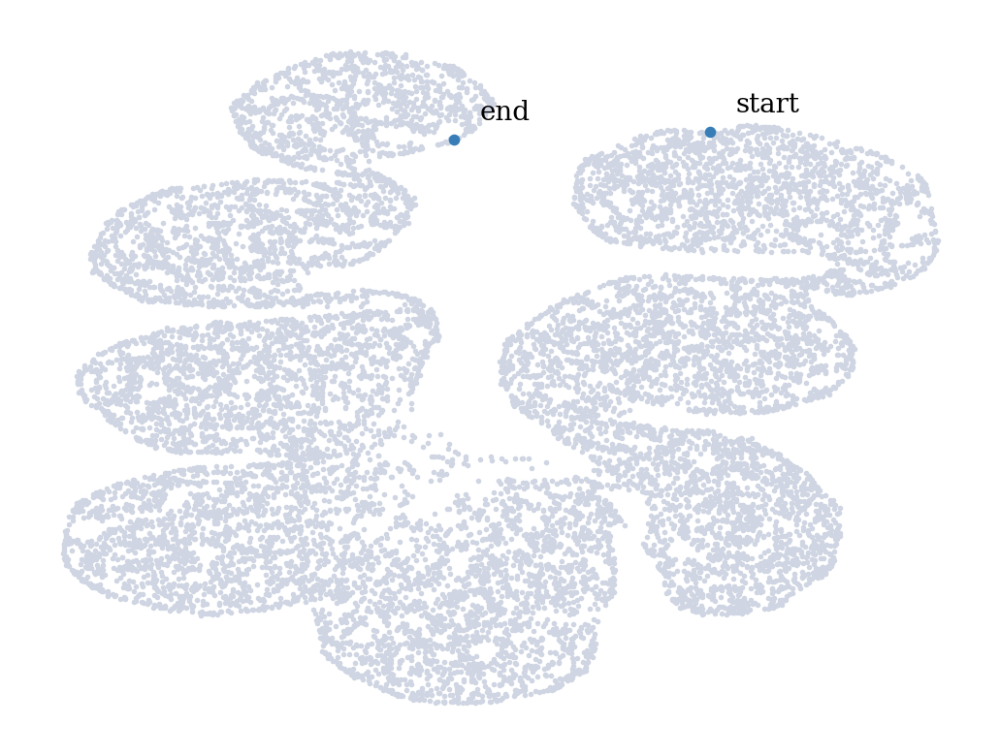

In [239]:
start_cell = latent.obs.index[np.where([latent.obs["dose_training"] == latent.obs["dose_training"].min()])[1][16]]
end_cell = latent.obs.index[np.where([latent.obs["dose_training"] == latent.obs["dose_training"].max()])[1][0]]

terminal_states = pd.Series(
    ["start", "end"],
    index=[start_cell, end_cell],
)

palantir.plot.highlight_cells_on_umap(latent, terminal_states)
plt.show()

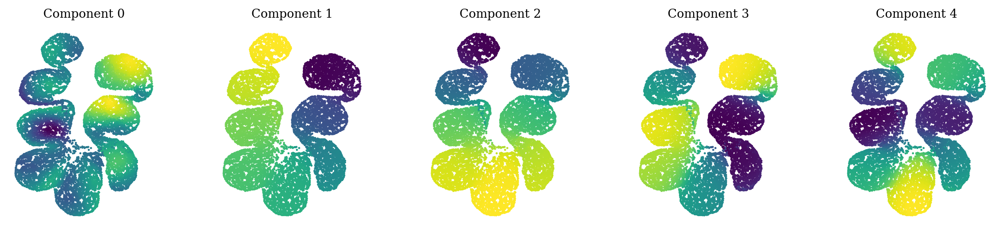

In [240]:
palantir.plot.plot_diffusion_components(latent)
plt.show()

In [241]:
pr_res = palantir.core.run_palantir(
    latent, 
    start_cell, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.03598816792170207 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 3.388441097736359 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


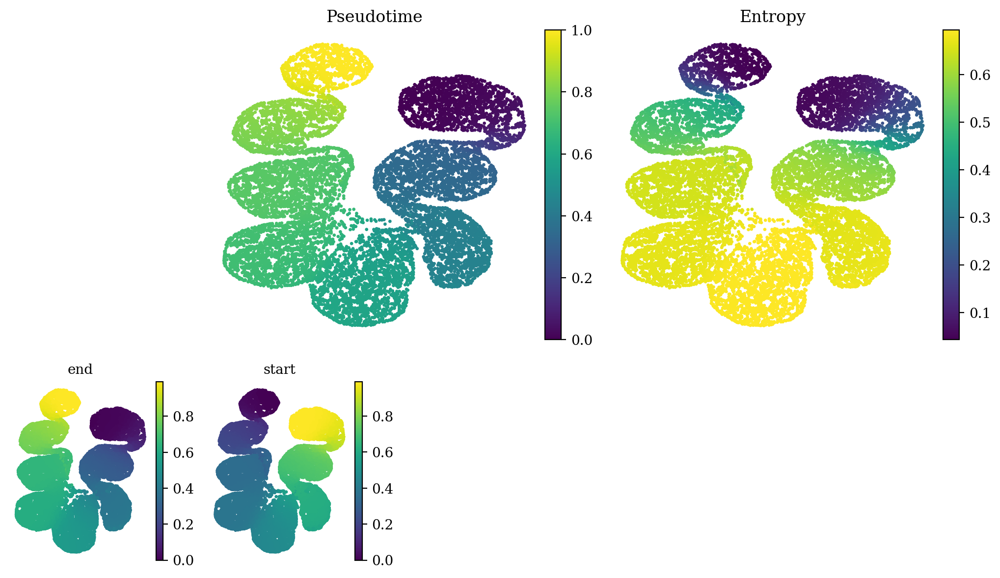

In [242]:
palantir.plot.plot_palantir_results(latent, s=2)
plt.show()

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


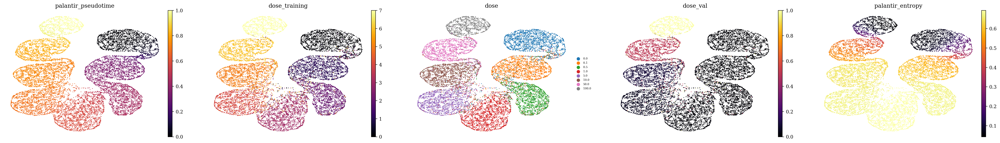

In [243]:
sc.pl.umap(
    latent,
    color=["palantir_pseudotime", "dose_training", "dose", "dose_val", "palantir_entropy"],
    ncols=5,
    color_map="inferno",
    frameon=False,
    legend_fontsize="xx-small",
    show=False,
)
plt.show()

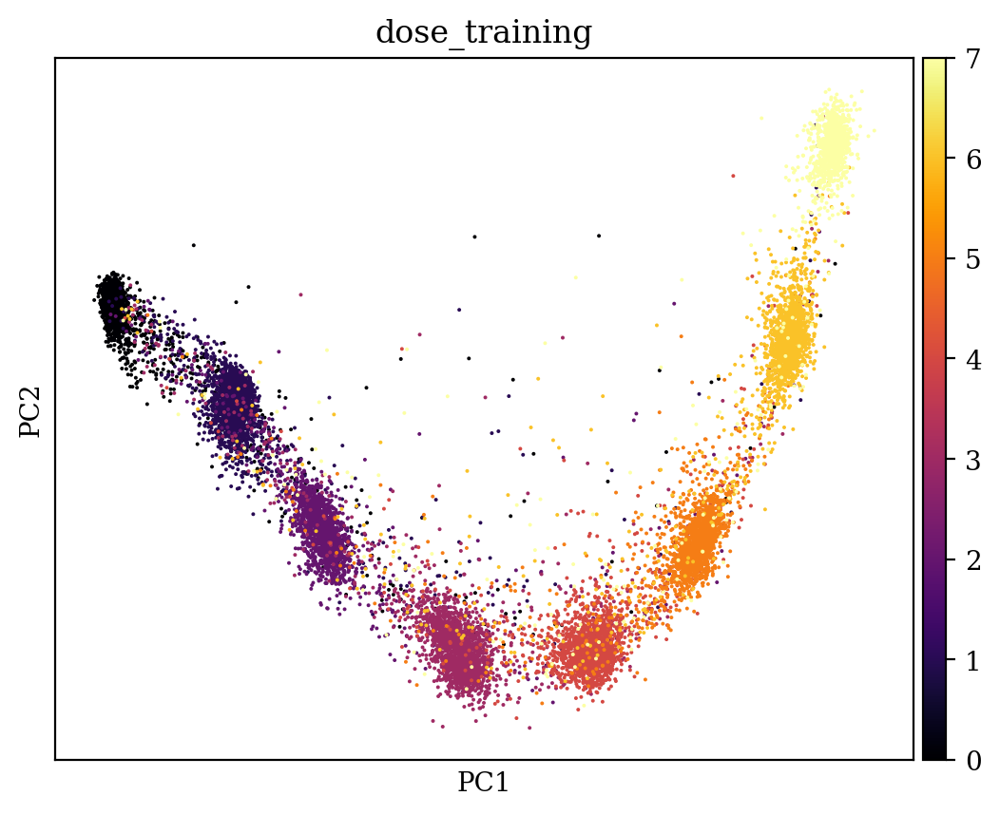

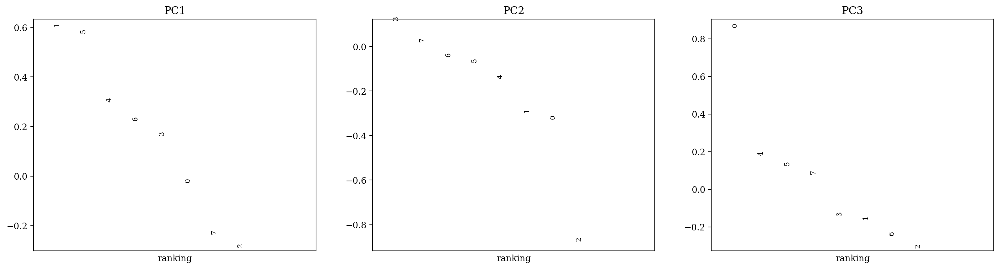

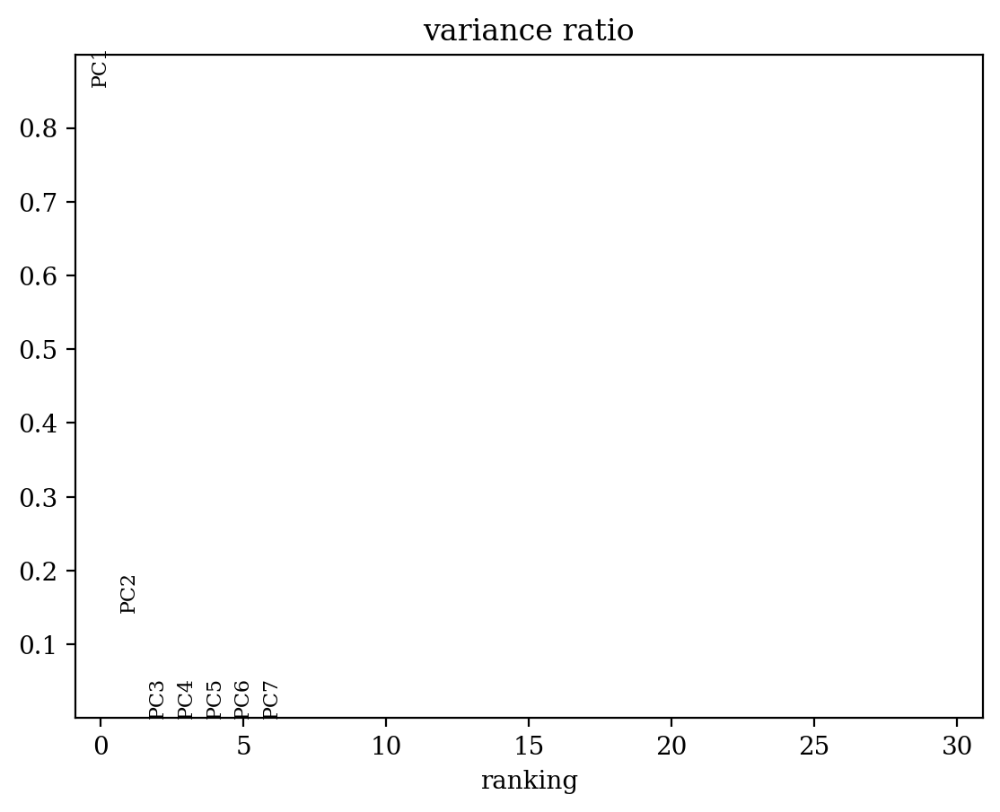

In [244]:
sc.pl.pca_overview(latent,
    color="dose_training",
    color_map="inferno"
)

In [245]:
from tardis._modelplotting import ModelPlotting

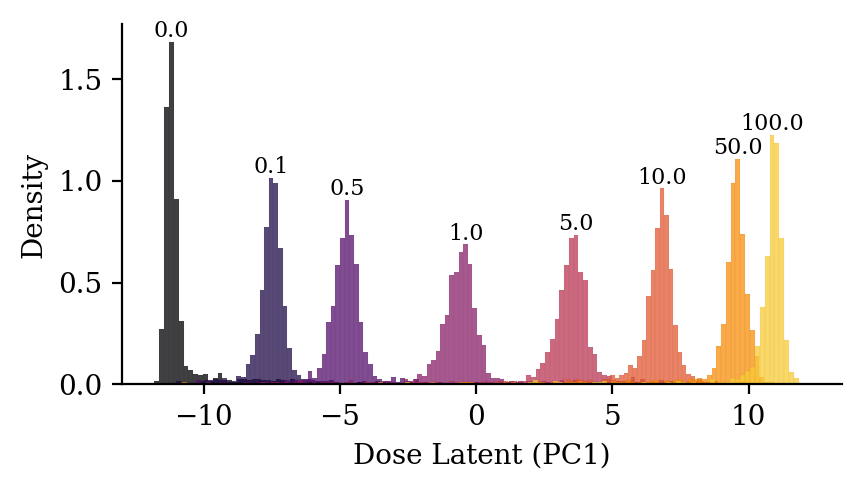

In [246]:
figsize = (6, 3)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)


bins = 128
doses = sorted(latent.obs["dose"].astype(float).unique())
inferno_palette = plt.cm.inferno
palette = [inferno_palette(i/len(doses)) for i in range(len(doses))]
# palette = ModelPlotting.generate_gray_tones(len(doses))
for ind, d in enumerate(doses):
    d = str(d)
    __latent = latent[latent.obs["dose"] == d]
    ax = sns.histplot(__latent.obsm["X_pca"][:, 0], bins=bins, stat="density", label=d, color=palette[ind], linewidth=0.01)

    # Calculate histogram data manually to find the peak
    data = __latent.obsm["X_pca"][:, 0]
    counts, bin_edges = np.histogram(data, bins=bins, density=True)
    max_index = np.argmax(counts)  # Index of the peak
    max_value = counts[max_index]  # Peak value
    max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2  # Center of the bin
    
    # Annotate the peak
    plt.text(max_bin_center, max_value, d, horizontalalignment='center', verticalalignment='bottom', fontsize=8)
    
plt.gca().set_xlabel("Dose Latent (PC1)")
sns.despine()
plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_histogram.pdf"), format="pdf")

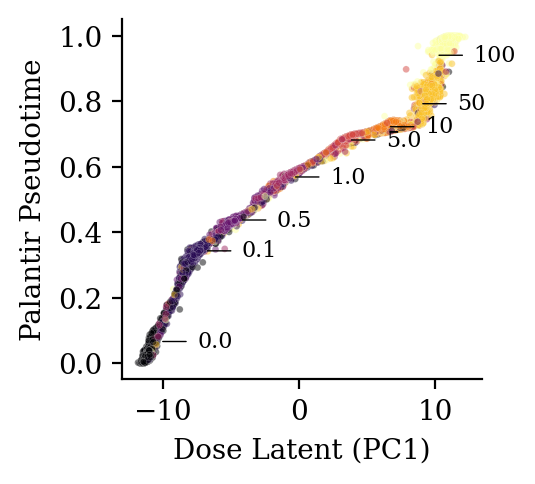

In [247]:
figsize = (3, 3)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

latent.obs["pca1"] = latent.obsm["X_pca"][:, 0].copy()
latent.obs["dose_continuous"] = latent.obs["dose"].astype(float)
palette = ModelPlotting.generate_gray_tones(len(latent.obs["dose_continuous"].unique()))

# Scatter plot
ax = sns.scatterplot(data=latent.obs, x="pca1", y="palantir_pseudotime", s=6, alpha=0.5, linewidth=0.1, hue="dose_training", palette="inferno")

# Calculate means for each dose and annotate
groups = latent.obs.groupby('dose_continuous')
for name, group in groups:
    mean_pca1 = group['pca1'].mean()
    mean_pseudotime = group['palantir_pseudotime'].mean()
    
    # Find non-overlapping positions for text annotations
    # Adjust these offsets based on your data's distribution and scale        
    text_pos_x = mean_pca1 + np.std(latent.obs["pca1"]) / 2 - 0.75
    text_pos_y = mean_pseudotime + np.std(latent.obs["palantir_pseudotime"]) / 2
    
    ax.annotate(f'{(name if float(name) <10 else int(name))}', xy=(mean_pca1, mean_pseudotime), xytext=(text_pos_x, mean_pseudotime),
                 arrowprops=dict(facecolor='black', arrowstyle='-', connectionstyle='arc3', lw=0.5), ha='left', va='center', fontsize=8)

sns.despine()
plt.xlabel("Dose Latent (PC1)")
plt.ylabel("Palantir Pseudotime")
ax.get_legend().remove()
plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_palantir.pdf"), format="pdf")

In [248]:
_a = sorted(latent.uns.keys())
for _i in _a:
    if _i.endswith("_colors"):
        del latent.uns[_i]

In [249]:
# plt.figure(figsize=(5,5))
# sc.pl.umap(
#     latent,
#     color=["dose"],
#     ncols=2,
#     frameon=False,
#     legend_fontsize="x-small",
#     show=False,
#     ax=plt.gca(),
#     legend_loc="on data",
#     legend_fontweight="semibold",
#     legend_fontoutline=2,
#     title="",
#     add_outline=True,
# )
# plt.show()

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


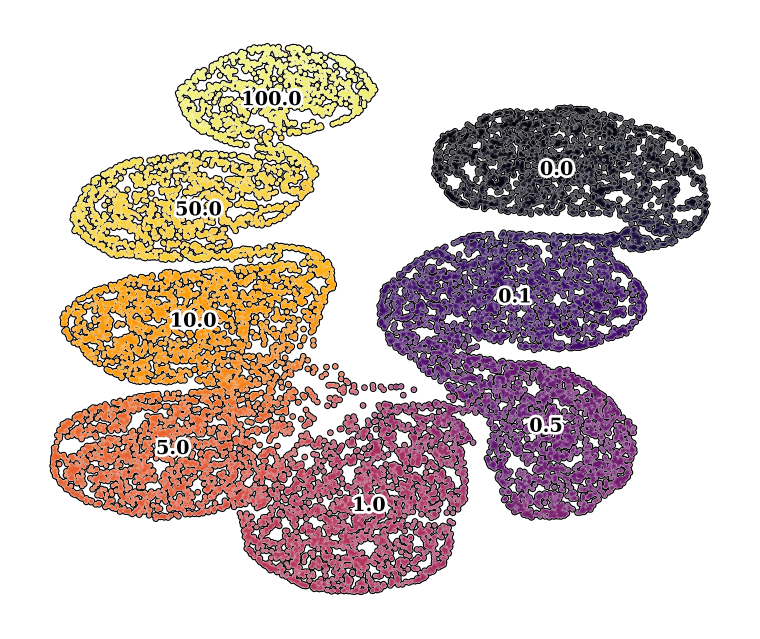

In [250]:
figsize = (6, 5)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

sc.pl.umap(
    latent,
    color=["pca1"],
    ncols=2,
    color_map="inferno",
    colorbar_loc=None,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=True,
)
sc.pl.umap(
    latent,
    color=["dose"],
    ncols=2,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=False,
    alpha=0
)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_umap_dose_latent.pdf"), format="pdf")

In [251]:
_adata = adata.copy()
_adata.obs = latent.obs.copy()
_adata.uns = latent.uns.copy()
_adata.obsm = latent.obsm.copy()
_adata.obsp = latent.obsp.copy()

_adata.X = vae.get_normalized_expression().values
sc.pp.scale(_adata)

_adata = _adata[_adata.obs["pca1"].sort_values().index,:]
_adata = _adata[_adata.obs["condition"] == "Nutlin"]
zzarr = _adata.X
zzarr.shape, _adata.shape

((2760, 4999), (2760, 4999))

In [252]:
palatte = ModelPlotting.generate_gray_tones(2)

(['AXL',
  'BLOC1S2',
  'CCDC90B',
  'CDKN1A',
  'DHRS7',
  'DSC3',
  'FAM104A',
  'FAM129A',
  'FDXR',
  'GALE',
  'GDF15',
  'GFRA1',
  'GRIP2',
  'IGFBP1',
  'MDM2',
  'MSC',
  'NINJ1',
  'NKX2-8',
  'NPAS3',
  'NUPR1',
  'PHLDA3',
  'RWDD2B',
  'SLC52A1',
  'SLFN5',
  'TMEM92-AS1',
  'TP53I3',
  'TRANK1'],
 [0.9755510546899107, 98.0, 2.0])

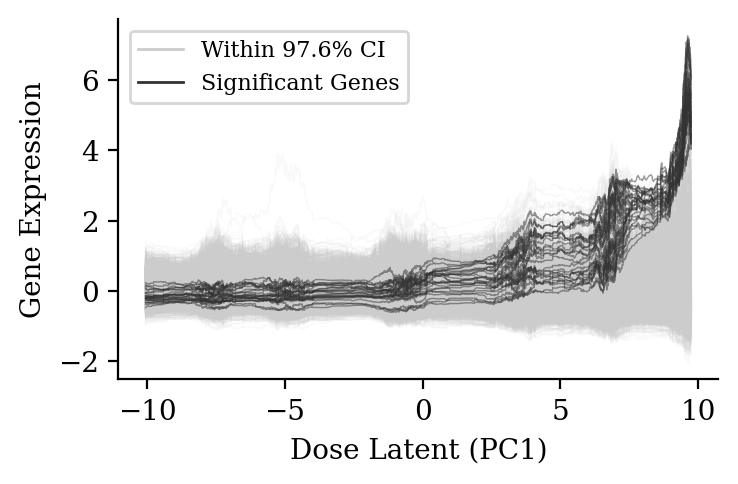

In [253]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy.signal import convolve
from scipy.signal.windows import gaussian
from tardis._modelplotting import ModelPlotting
palatte = ModelPlotting.generate_gray_tones(2)

# Constants
THR = 4  # Threshold for filtering gene expression
GENE = 4999  # Number of genes
MAC = 2**6  # Window size for moving average calculation

cumulative_probability = norm.cdf(2.25)
confidence_interval = 2 * cumulative_probability - 1
high_confidence = round(confidence_interval, 2) * 100
low_confidence = 100 - high_confidence

# Creating a Gaussian window
window = gaussian(MAC, std=MAC*8)
window /= window.sum()

# Calculating the length of the convolution output for moving average
output_length = len(zzarr) - MAC + 1

# Creating a boolean mask for slicing the array
mask = np.zeros(len(zzarr), dtype=bool)
mask[int((MAC - 1)/2):int((MAC - 1)/2) + output_length] = True

# Initializing the plot with specified figure size
figsize = (5, 3)
fig = plt.figure(figsize=(figsize[0] * 3, figsize[1] * 3))
fig.subplots_adjust(left=0.4, right=0.6, top=0.6, bottom=0.4)

texts = []  # List to store gene names that are prominently visible
x=_adata.obs["pca1"][mask]
# First pass: Plot the moving average for each gene expression array where the values are within the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.all((THR > ma[-1]) & (-THR < ma[-1]))
    if sign:
        plt.plot(x, ma, linewidth=0.5, color=palatte[1], alpha=0.1, label=f"Within {round(confidence_interval*100,1)}% CI")

# Second pass: Plot and highlight gene expressions that exceed the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.all((THR > ma[-1]) & (-THR < ma[-1]))
    if not sign:
        plt.plot(x, ma, linewidth=0.5, color=palatte[0], alpha=0.5, label=f"Significant Genes")
        texts.append(_adata.var.index[i])  # Storing gene names

plt.ylabel("Gene Expression")
plt.xlabel("Dose Latent (PC1)")
# plt.xticks([])  # Hiding x-axis ticks for better clarity
sns.despine()

# Remove duplicate labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
from matplotlib.lines import Line2D
# Create custom legend handles with zero alpha and thicker lines
custom_handles = []
for label, labelcolor in zip(by_label.keys(), [palatte[1], palatte[0]]):
    handle = Line2D([0], [0], color=labelcolor, linewidth=1, alpha=1, label=label)
    custom_handles.append(handle)
plt.legend(handles=custom_handles, loc="upper left", fontsize=8)

plt.savefig(os.path.join("/home/icb/kemal.inecik/work/codes/tardis/training/server/figures", f"fig3_sciplex_genes.pdf"), format="pdf")

sorted(texts), [confidence_interval, high_confidence, low_confidence]

In [254]:
len(ma), sum(mask)

(2697, 2697)

In [255]:
np.unique(latent.obs["cell_type"])

array(['A549'], dtype=object)

Reduced transcriptional activity in the p53 pathway of senescent cells revealed by the MDM2 antagonist nutlin-3
> doi: 10.18632/aging.100091

- TP53I3
- CDKN1A
- GDF15
- MDM2
- FDXR
- NUPR1

- PHLDA3: p53
  https://jhoonline.biomedcentral.com/articles/10.1186/s13045-017-0500-5
- SULF2: nutlin
  https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2440635/
- SLC52A1: p53
  https://pubmed.ncbi.nlm.nih.gov/34524871/
- ALDH3A1: nutlin
  https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003731
- PINCR: p53
  https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5470874/

In [256]:
scipy.stats.spearmanr(latent.obs["pca1"], latent.obs["dose_training"])

SignificanceResult(statistic=0.9420187790019264, pvalue=0.0)

In [258]:
scipy.stats.pearsonr(latent.obs["pca1"], latent.obs["dose_training"])

PearsonRResult(statistic=0.94142776004354, pvalue=0.0)